# Railway Track Fault Detection
---
|Subject:|Mathematical Modeling Practice|
|---|---|
|Semester:|Fall 2022|
|Name:|Tamás Demus|
|NEPTUN:|XP4B9D|


## Dataset
---
|Name:|Railway Track Fault Detection|
|---|---|
|Link to dataset:|https://www.kaggle.com/datasets/salmaneunus/railway-track-fault-detection|


## System setup
---
Importing modules

In [1]:
import os
import gc

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

import cv2 as cv

import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

from sklearn.metrics import ConfusionMatrixDisplay, RocCurveDisplay

from tqdm import tqdm


2022-12-19 06:44:51.181125: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-12-19 06:44:52.143743: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/demust/py39/lib/python3.9/site-packages/cv2/../../lib64:
2022-12-19 06:44:52.143791: I tensorflow/compiler/xla/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-12-19 06:44:54.019670: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror:

Setting up environment

In [2]:
raw_folder = './raw/'
data_folder = './data/'
preprocessed_folder = './preprocessed/'
augmented_folder = './augmented/'

PATH = [
    'Train/Non defective/',
    'Train/Defective/',
    'Validation/Non defective/',
    'Validation/Defective/',
    'Test/Non defective/',
    'Test/Defective/',
]

RAW_PATH = [os.path.join(raw_folder, p) for p in PATH]
DATA_PATH = [os.path.join(data_folder, p) for p in PATH]
PREPROCESSED_PATH = [os.path.join(preprocessed_folder, p) for p in PATH]
AUGMENTED_PATH = [os.path.join(augmented_folder, p) for p in PATH[:2]]

for p in DATA_PATH:
    if not os.path.exists(p):
        os.makedirs(p)
        
for p in PREPROCESSED_PATH:
    if not os.path.exists(p):
        os.makedirs(p)
        
for p in AUGMENTED_PATH:
    if not os.path.exists(p):
        os.makedirs(p)

## Raw data
---
File types

In [3]:
ext = []

for p in RAW_PATH:
    for f in os.listdir(p):
        ext.append(os.path.splitext(f)[-1])
    
print(set(ext))

{'.webp', '.jpeg', '.jpg'}


Copy raw dataset with new filenames and converting the extensions

In [4]:
i = 0
p_new = 0
for p in RAW_PATH:
    for f in tqdm(os.listdir(p), desc=p):
        dst = os.path.join(DATA_PATH[p_new], str(i)+'.jpg')
        if not os.path.exists(dst):
            src = os.path.join(p, f)
            img = cv.imread(src)
            cv.imwrite(dst, img)
        i += 1
    p_new += 1


./raw/Test/Defective/: 100%|██████████| 11/11 [00:00<00:00, 13257.86it/s]


## Clean data
---
Create image dataframe

In [5]:
images = pd.DataFrame({
    'type': pd.Series(dtype='str'),
    'defect': pd.Series(dtype='int'),
    'defect_str': pd.Series(dtype='str'),
    'path': pd.Series(dtype='str'),
    'filename': pd.Series(dtype='str'),
    'img': pd.Series(dtype='str'),
    'height': pd.Series(dtype='int'),
    'width': pd.Series(dtype='int'),
    'components': pd.Series(dtype='int'),
    'R_mean': pd.Series(dtype='float'),
    'G_mean': pd.Series(dtype='float'),
    'B_mean': pd.Series(dtype='float')
})

for each in DATA_PATH:
    p = each.split('/')
    if p[3] == 'Defective':
        y = 1
    else:
        y = 0
    for img in os.listdir(each):
        data = {
            'type': p[2].lower(),
            'defect': y,
            'defect_str': p[3],
            'path': each,
            'filename': img,
            'img': os.path.join(each, img),
            'height': 0,
            'width': 0,
            'components': 0,
            'R_mean': 0,
            'G_mean': 0,
            'B_mean': 0
        }
        df = pd.DataFrame(data=data, index=[1])
        images = pd.concat([images, df])

images.reset_index(inplace=True, drop=True)
display(images)
images.info()

,type,defect,defect_str,path,filename,img,height,width,components,R_mean,G_mean,B_mean
0,train,0,Non defective,./data/Train/Non defective/,97.jpg,./data/Train/Non defective/97.jpg,0,0,0,0.0,0.0,0.0
1,train,0,Non defective,./data/Train/Non defective/,79.jpg,./data/Train/Non defective/79.jpg,0,0,0,0.0,0.0,0.0
2,train,0,Non defective,./data/Train/Non defective/,114.jpg,./data/Train/Non defective/114.jpg,0,0,0,0.0,0.0,0.0
3,train,0,Non defective,./data/Train/Non defective/,18.jpg,./data/Train/Non defective/18.jpg,0,0,0,0.0,0.0,0.0
4,train,0,Non defective,./data/Train/Non defective/,46.jpg,./data/Train/Non defective/46.jpg,0,0,0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
379,test,1,Defective,./data/Test/Defective/,381.jpg,./data/Test/Defective/381.jpg,0,0,0,0.0,0.0,0.0
380,test,1,Defective,./data/Test/Defective/,379.jpg,./data/Test/Defective/379.jpg,0,0,0,0.0,0.0,0.0
381,test,1,Defective,./data/Test/Defective/,377.jpg,./data/Test/Defective/377.jpg,0,0,0,0.0,0.0,0.0
382,test,1,Defective,./data/Test/Defective/,380.jpg,./data/Test/Defective/380.jpg,0,0,0,0.0,0.0,0.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 384 entries, 0 to 383
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   type        384 non-null    object 
 1   defect      384 non-null    int64  
 2   defect_str  384 non-null    object 
 3   path        384 non-null    object 
 4   filename    384 non-null    object 
 5   img         384 non-null    object 
 6   height      384 non-null    int64  
 7   width       384 non-null    int64  
 8   components  384 non-null    int64  
 9   R_mean      384 non-null    float64
 10  G_mean      384 non-null    float64
 11  B_mean      384 non-null    float64
dtypes: float64(3), int64(4), object(5)
memory usage: 36.1+ KB


## Data exploration
---
Extract basic features from the images

In [6]:
height = []
width = []
components = []
R_mean = []
G_mean = []
B_mean = []

for i in tqdm(images.index):
    image = cv.imread(images.iloc[i].img)
    height.append(image.shape[0])
    width.append(image.shape[1])
    components.append(image.shape[2])
    R_mean.append(np.mean(image[:,:,0]))
    G_mean.append(np.mean(image[:,:,1]))
    B_mean.append(np.mean(image[:,:,2]))

images.update({'height': height})
images.update({'width': width})
images.update({'components': components})
images.update({'R_mean': R_mean})
images.update({'G_mean': G_mean})
images.update({'B_mean': B_mean})

100%|██████████| 384/384 [03:16<00:00,  1.95it/s]


Shape of the images

Minimum  height  :  148  @  243
Maximum  height  :  8000  @  241
Minimum  width  :  156  @  297
Maximum  width  :  8000  @  152
Minimum  components  :  3  @  0
Maximum  components  :  3  @  0
Minimum sizes:
height    322
width     156
Name: 297, dtype: int64
height    148
width     194
Name: 243, dtype: int64


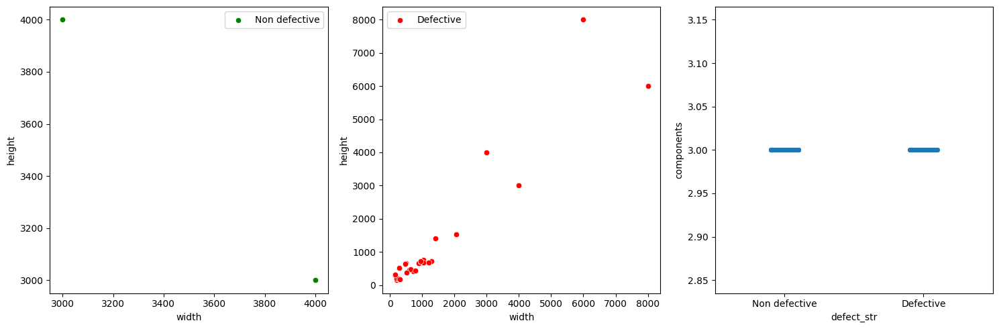

In [7]:
dims = ['height', 'width', 'components']
for dim in dims:
    print('Minimum ', dim, ' : ', images[dim].min(), ' @ ', images[dim].argmin())
    print('Maximum ', dim, ' : ', images[dim].max(), ' @ ', images[dim].argmax())

min_height = np.argmin(images.height)
min_width = np.argmin(images.width)
print('Minimum sizes:')
print(images[['height', 'width']].iloc[min_width])
print(images[['height', 'width']].iloc[min_height])

fig, ax = plt.subplots(1, 3, figsize=(15, 5), tight_layout=True)
sns.scatterplot(x='width', y='height', data=images[images.defect == 0], ax=ax[0], label='Non defective', color='green')
sns.scatterplot(x='width', y='height', data=images[images.defect == 1], ax=ax[1], label='Defective', color='red')
sns.stripplot(x='defect_str', y='components', data=images, ax=ax[2])
plt.show()

Main component distribution of the images

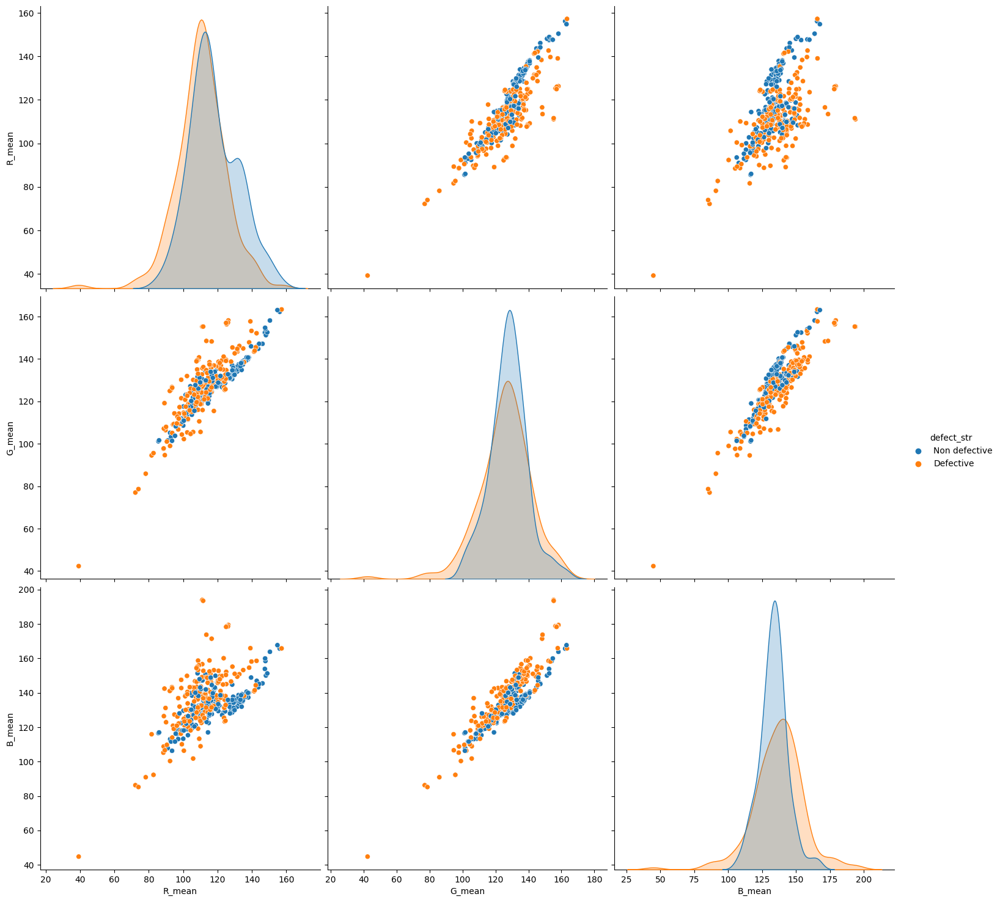

In [8]:
cols = ['R_mean', 'G_mean', 'B_mean']
sns.pairplot(data=images, vars=cols, hue='defect_str', height=5)
plt.show()

Dataset balance

In [9]:
images.groupby(['type', 'defect_str']).count()

defect  path  filename  img  height  width  \
type       defect_str                                                  
test       Defective          11    11        11   11      11     11   
           Non defective      11    11        11   11      11     11   
train      Defective         150   150       150  150     150    150   
           Non defective     150   150       150  150     150    150   
validation Defective          31    31        31   31      31     31   
           Non defective      31    31        31   31      31     31   

                          components  R_mean  G_mean  B_mean  
type       defect_str                                         
test       Defective              11      11      11      11  
           Non defective          11      11      11      11  
train      Defective             150     150     150     150  
           Non defective         150     150     150     150  
validation Defective              31      31      31      31  
           Non defective          31      31      31      31

Generate random sample from training data

In [10]:
N_samples = 4
random_sample_idx = []
for i in range(N_samples):
    idx = np.random.choice(images[(images.type == 'train') & (images.defect == 0)].index)
    random_sample_idx.append(idx)
for i in range(N_samples, 2*N_samples):
    idx = np.random.choice(images[(images.type == 'train') & (images.defect == 1)].index)
    random_sample_idx.append(idx)
random_sample = images.iloc[random_sample_idx].copy()
random_sample

,type,defect,defect_str,path,filename,img,height,width,components,R_mean,G_mean,B_mean
97,train,0,Non defective,./data/Train/Non defective/,110.jpg,./data/Train/Non defective/110.jpg,3000,4000,3,119.261745,130.045492,135.793483
27,train,0,Non defective,./data/Train/Non defective/,41.jpg,./data/Train/Non defective/41.jpg,3000,4000,3,115.428379,126.760820,131.965124
109,train,0,Non defective,./data/Train/Non defective/,70.jpg,./data/Train/Non defective/70.jpg,3000,4000,3,95.995898,109.326466,118.813858
107,train,0,Non defective,./data/Train/Non defective/,111.jpg,./data/Train/Non defective/111.jpg,3000,4000,3,104.628083,117.429305,125.239807
292,train,1,Defective,./data/Train/Defective/,228.jpg,./data/Train/Defective/228.jpg,1407,1408,3,106.209576,117.706819,140.576842
265,train,1,Defective,./data/Train/Defective/,197.jpg,./data/Train/Defective/197.jpg,3000,4000,3,124.704781,130.653900,132.858513
165,train,1,Defective,./data/Train/Defective/,175.jpg,./data/Train/Defective/175.jpg,444,790,3,81.627181,94.543793,115.899401
253,train,1,Defective,./data/Train/Defective/,183.jpg,./data/Train/Defective/183.jpg,3000,4000,3,112.739350,122.041598,129.027274


Visualize random sample

100%|██████████| 8/8 [00:03<00:00,  2.11it/s]


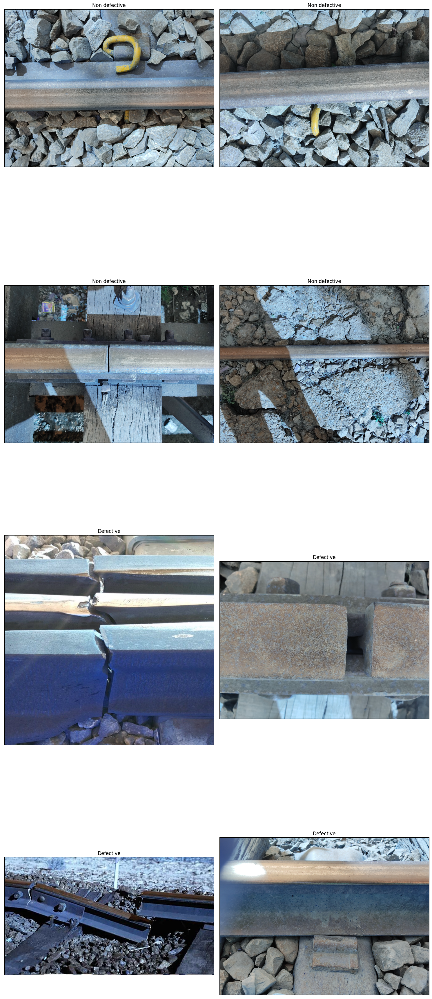

In [11]:
fig, ax = plt.subplots(N_samples, 2, figsize=(15, 10*N_samples), tight_layout=True)
ax = ax.flatten()

for i, idx in enumerate(tqdm(random_sample.index)):
    image = cv.imread(images.img[idx])
    ax[i].imshow(image)
    ax[i].set_xticks(ticks=[])
    ax[i].set_yticks(ticks=[])
    ax[i].set_title(images.defect_str[idx])

plt.show()

Basic information on random sample: color components on RGB and HSV

8it [00:22,  2.87s/it]


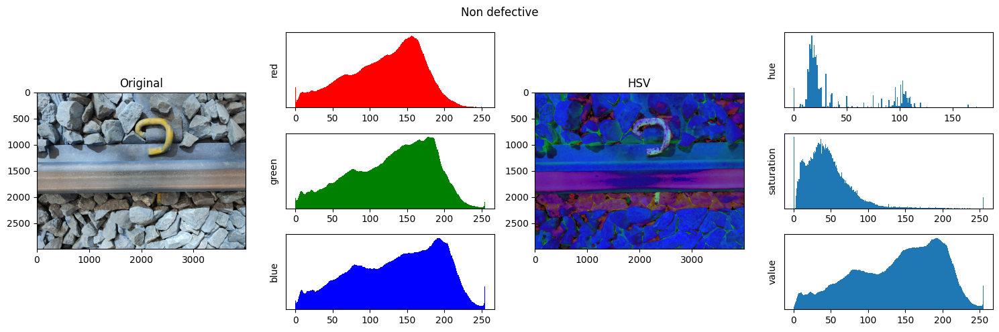

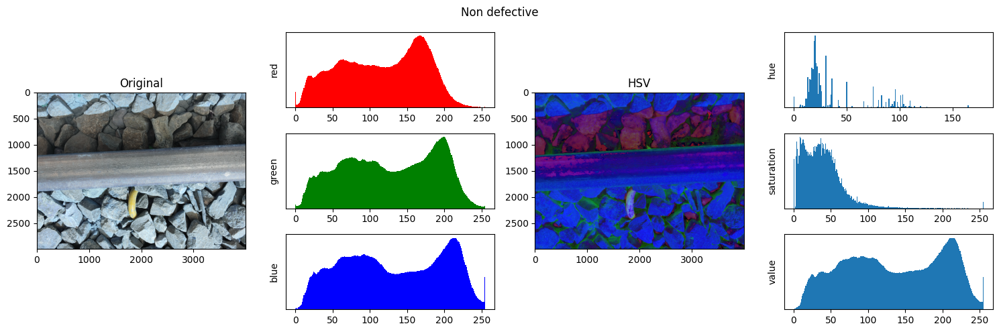

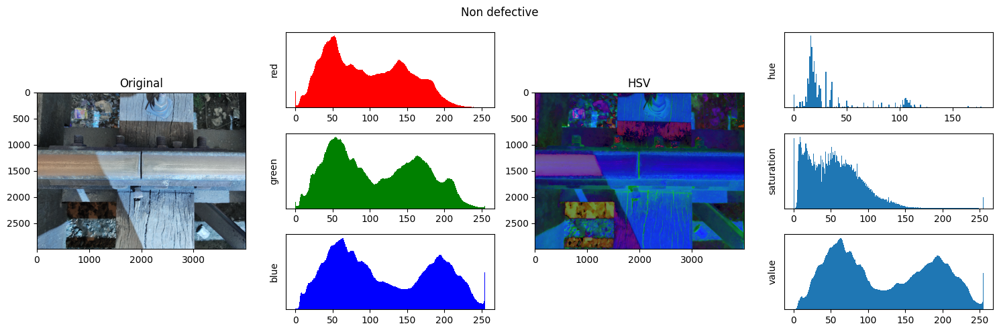

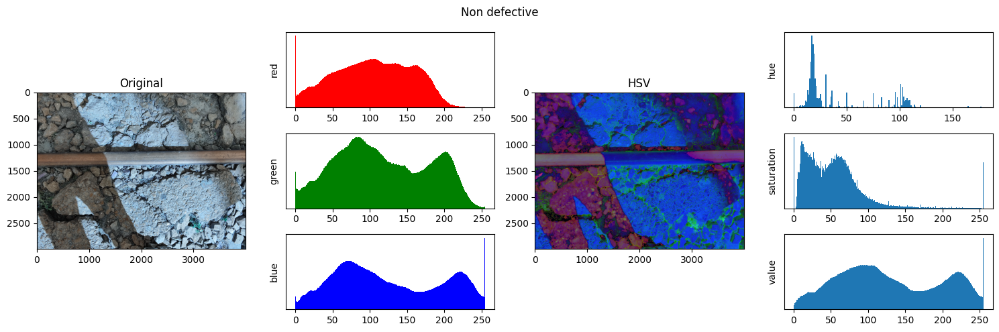

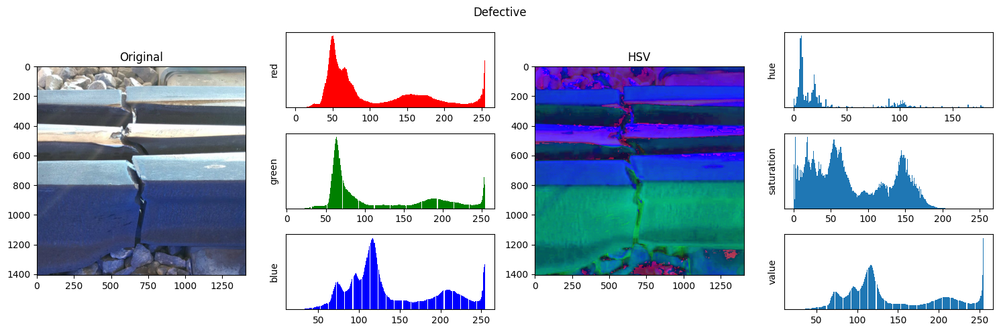

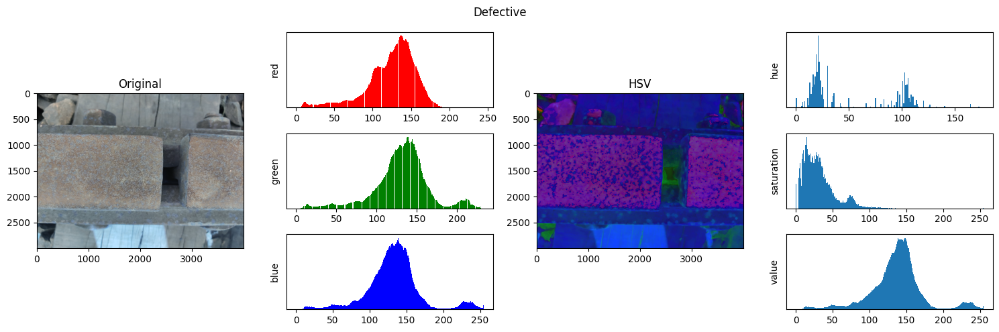

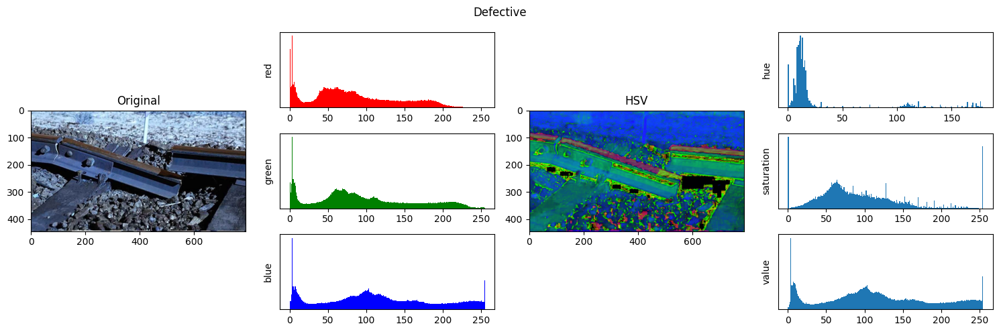

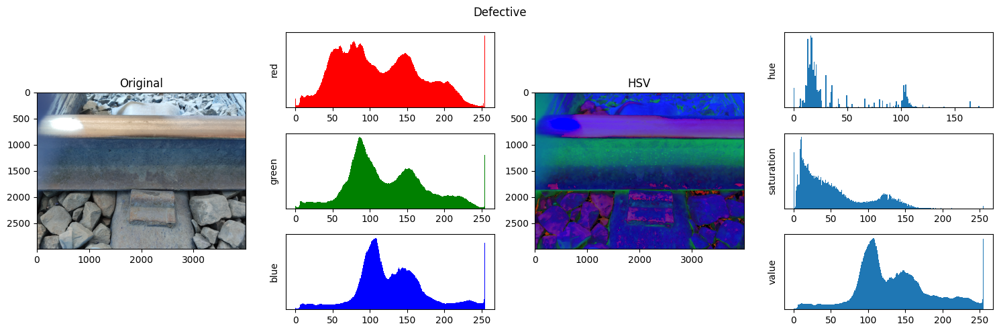

In [12]:
gs = gridspec.GridSpec(3, 4)

for sample in tqdm(random_sample[['img', 'defect_str']].itertuples()):
    fig = plt.figure(figsize=(15, 5), tight_layout=True)
    fig.suptitle(sample.defect_str)
    ax = [
        fig.add_subplot(gs[:, 0]),
        fig.add_subplot(gs[0, 1]),
        fig.add_subplot(gs[1, 1]),
        fig.add_subplot(gs[2, 1]),
        fig.add_subplot(gs[:, 2]),
        fig.add_subplot(gs[0, 3]),
        fig.add_subplot(gs[1, 3]),
        fig.add_subplot(gs[2, 3]),
    ]
    image = cv.imread(sample.img)
    ax[0].imshow(image)
    ax[0].set_title('Original')
    
    for c, component in enumerate(['red', 'green', 'blue']):
        ax[c+1].hist(image[:, :, c].ravel(), bins=256, color=component)
        ax[c+1].set_ylabel(component)
        ax[c+1].set_yticks([])
        
    hsv = cv.cvtColor(image, cv.COLOR_BGR2HSV)
    ax[4].imshow(hsv)
    ax[4].set_title('HSV')
    
    for c, component in enumerate(['hue', 'saturation', 'value']):
        bins = [180, 256, 256]
        ax[c+5].hist(hsv[:, :, c].ravel(), bins=bins[c])
        ax[c+5].set_ylabel(component)
        ax[c+5].set_yticks([])

## Image processing toolkit
---
Class definition for image processing

In [6]:
class ImageProcessor:
    def __init__(self, sample, height, width):
        self.imgs = [cv.imread(sample.img)]
        self.step = ['original']
        self.plot_kwargs = [{}]
        self.lines = []
        self.height = height
        self.width = width
        self.noise_filt_type = 'median'
        self.noise_filt_size = 1
        self.Laplacian_size = 5
        self.Canny_low = 100
        self.Canny_high = 200
        self.translator = {
            'resize': self.resize,
            'grayscale': self.grayscale,
            'binary': self.binary,
            'hist_eq': self.hist_eq,
            'noise_filt': self.noise_filt,
            'stretching': self.stretching,
            'Laplacian': self.Laplacian,
            'Canny': self.Canny,
            'Hough': self.Hough,
            'show': self.show
        }
    
    def resize(self):
        h, w = self.imgs[-1].shape[:2]
        if w < h:
            nh = int(w/h * self.height)
            nw = self.width
            self.imgs.append(
                cv.resize(self.imgs[-1], (nh, nw), interpolation=cv.INTER_AREA)
            )
            pad = int((nh - self.height) / 2)
            if pad > 0:
                self.imgs[-1] = self.imgs[-1][:, pad:-pad]
        else:
            nh = self.height
            nw = int(h/w * self.width)
            self.imgs.append(
                cv.resize(self.imgs[-1], (nh, nw), interpolation=cv.INTER_AREA)
            )
            pad = int((nw - self.width) / 2)
            if pad > 0:
                self.imgs[-1] = self.imgs[-1][pad:-pad, :]
        self.step.append('resize')
        self.plot_kwargs.append({})

    def grayscale(self):
        self.imgs.append(
            cv.cvtColor(self.imgs[-1], cv.COLOR_BGR2GRAY)
        )
        self.step.append('grayscale')
        self.plot_kwargs.append({'cmap': 'gray'})
    
    def binary(self):
        self.imgs.append(
            cv.threshold(self.imgs[-1], 127, 255, cv.THRESH_BINARY)[1]
        )
        self.step.append('binary')
        self.plot_kwargs.append({'cmap': 'gray'})
        
    def hist_eq(self):
        self.imgs.append(
            cv.equalizeHist(self.imgs[-1])
        )
        self.step.append('histogram equalization')
        self.plot_kwargs.append({'cmap': 'gray'})
        
    def noise_filt(self):
        if self.noise_filt_type == 'Gaussian':
            self.imgs.append(
                cv.GaussianBlur(self.imgs[-1], self.noise_filt_size, 0)
            )
        elif self.noise_filt_type == 'median':
            self.imgs.append(
                cv.medianBlur(self.imgs[-1], self.noise_filt_size)
            )
        else:
            self.imgs.append(self.imgas[-1])
        self.step.append('noise filter')
        self.plot_kwargs.append({'cmap': 'gray'})
        
    def stretching(self):
        self.imgs.append(
            cv.normalize(self.imgs[-1], None, 0, 1)
        )
        self.step.append('stretch')
        self.plot_kwargs.append({'cmap': 'gray'})
        
    def Laplacian(self):
        self.imgs.append(
            np.uint(np.absolute(cv.Laplacian(self.imgs[-1], ddepth=cv.CV_64F, ksize=self.Laplacian_size)))
        )
        self.step.append('Laplacian')
        self.plot_kwargs.append({'cmap': 'gray'})
    
    def Canny(self):
        self.imgs.append(
            cv.Canny(self.imgs[-1], self.Canny_low, self.Canny_high)
        )
        self.step.append('Canny')
        self.plot_kwargs.append({'cmap': 'gray'})
        
    def Hough(self):
        self.imgs.append(
            self.imgs[-1]
        )
        self.lines = cv.HoughLinesP(self.imgs[-1], 1, np.pi/180, 10, minLineLength=20, maxLineGap=5)
        self.step.append('Hough')
        self.plot_kwargs.append({'cmap': 'gray'})
        
    def show(self):
        _, ax = plt.subplots(1, len(self.imgs), figsize=(15, 5), tight_layout=True)
        for i, img in enumerate(self.imgs):
            ax[i].imshow(img, **self.plot_kwargs[i])
            ax[i].set_xticks(ticks=[])
            ax[i].set_yticks(ticks=[])
            ax[i].set_title(self.step[i])
            if self.step[i] == 'Hough':
                for line in self.lines:
                    x1, y1, x2, y2 = line[0]
                    x = np.linspace(x1, x2, 100, endpoint=True)
                    y = np.linspace(y1, y2, 100, endpoint=True)
                    ax[i].plot(x, y, c='green')
        ax[0].set_ylabel(sample.defect_str)
        plt.show()

Edge detection

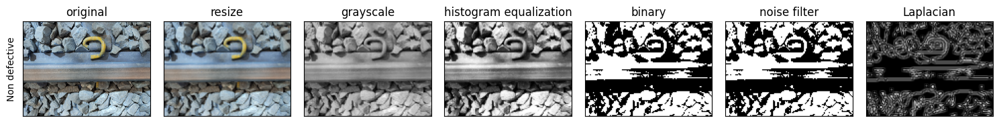

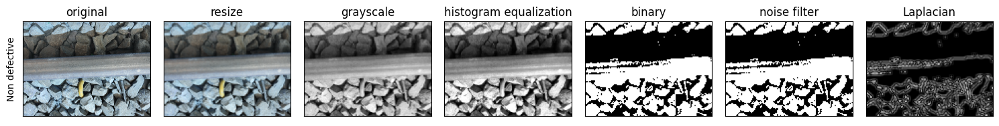

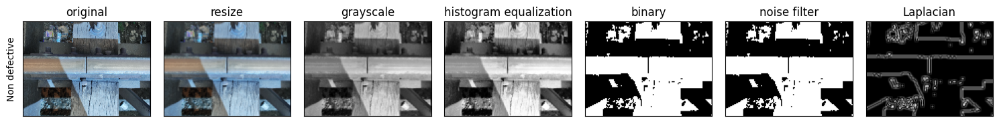

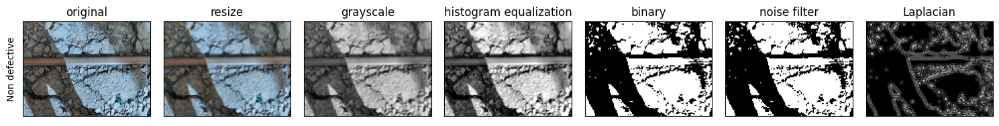

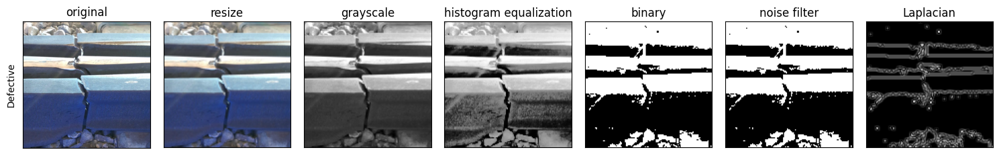

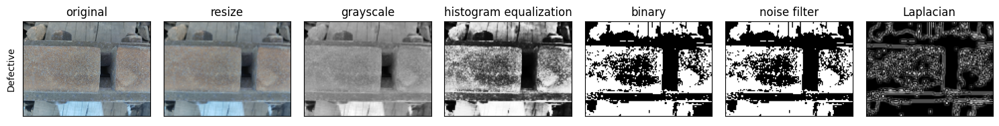

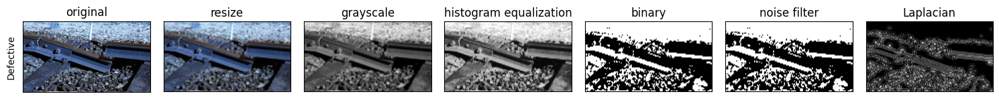

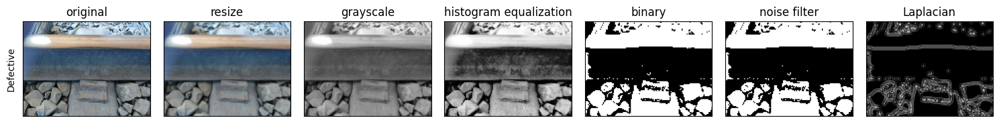

In [46]:
for sample in random_sample.itertuples():
    obj = ImageProcessor(sample, 128, 128)
    obj.resize()
    obj.grayscale()
    obj.hist_eq()
    obj.binary()
    obj.noise_filt()
    obj.Laplacian()
    obj.show()
    del obj 
    gc.collect()   


Line detection

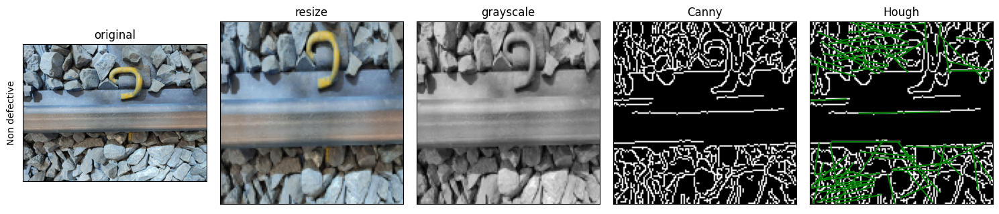

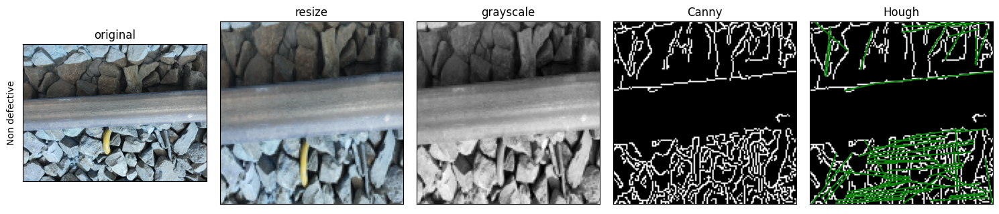

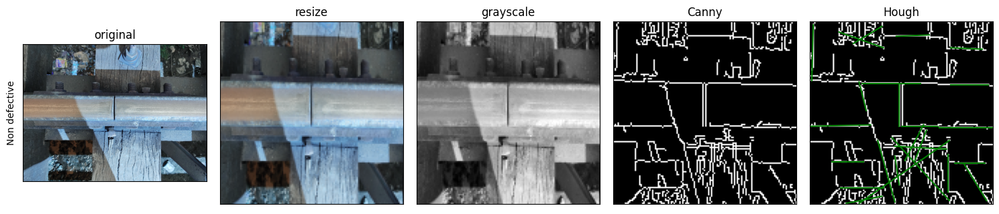

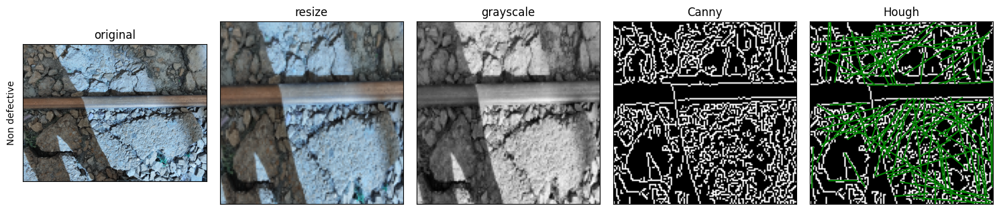

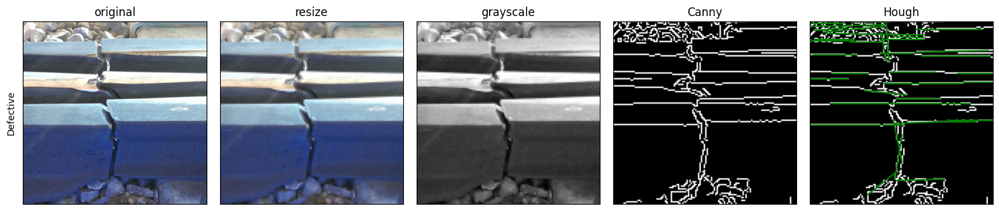

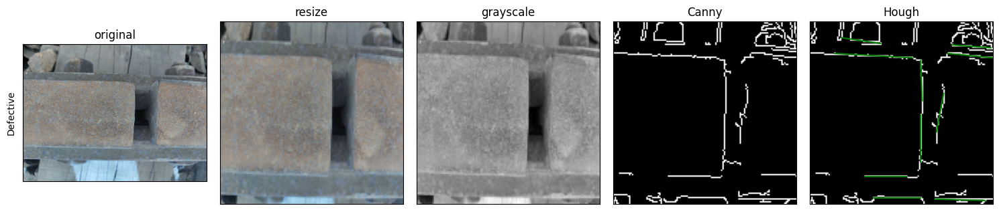

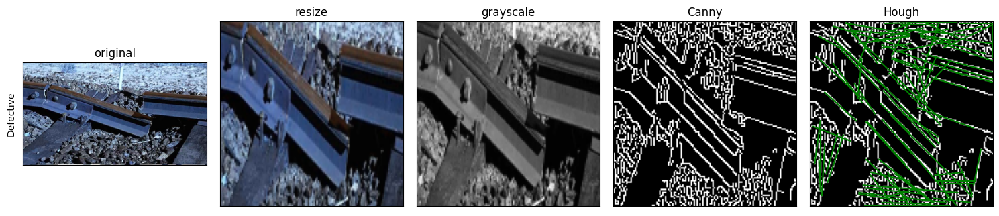

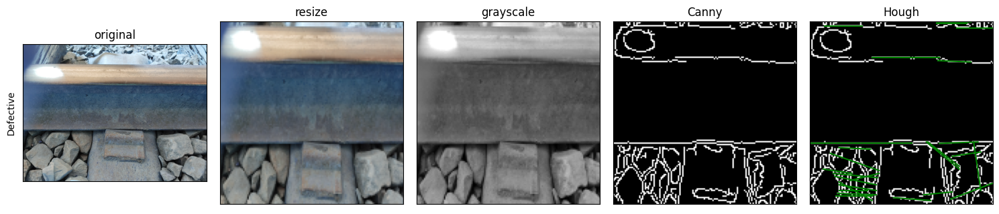

In [15]:
for sample in random_sample.itertuples():
    obj = ImageProcessor(sample, 128, 128)
    obj.resize()
    obj.grayscale()
    obj.Canny()
    obj.Hough()
    obj.show()
    del obj
    gc.collect()

## Fine tuning data preprocessing
---
Setting up functions and dataframe for iteration processing

In [7]:
class FineTuner:
    def __init__(self):
        self.height = 128
        self.width = 128
        self.steps = []
        self.data = {}
        self.history = []
        self.results = []
        self.class_names = []
        self.epochs = 10
        self.batch_size = 32

    def image_processor(self):
        for root, _, files in os.walk(preprocessed_folder, topdown=False):
            for name in files:
                os.remove(os.path.join(root, name))
            
        for sample in images.itertuples():
            path = sample.img.split('/')
            path[1] = preprocessed_folder
            dst = os.path.join(*path[1:])
            
            obj = ImageProcessor(sample, self.height, self.width)
            
            for step in self.steps:
                obj.translator.get(step)
        
            cv.imwrite(dst, obj.imgs[-1])
            del obj

    def setup_trial_net(self):   
        datasets = ['Train', 'Validation', 'Test']

        for dataset in datasets:
            self.data.update({
                dataset: tf.keras.utils.image_dataset_from_directory(
                    os.path.join(preprocessed_folder, dataset),
                    labels='inferred',
                    image_size=(self.height, self.width), 
                    color_mode='grayscale',
                    batch_size=self.batch_size
                )
            })
        self.class_names = self.data['Train'].class_names
            
        self.model = Sequential([
            layers.Rescaling(1./255, input_shape=(self.height, self.width, 1)),
            layers.Conv2D(16, 3, padding='same', activation='relu'),
            # layers.MaxPooling2D(),
            # layers.Conv2D(32, 3, padding='same', activation='relu'),
            # layers.MaxPooling2D(),
            layers.Conv2D(64, 3, padding='same', activation='relu'),
            layers.MaxPooling2D(),
            layers.Flatten(),
            layers.Dense(units=int(self.height*self.width/2), activation='relu'),
            # layers.Dense(units=int(self.height*self.width/4), activation='relu'),
            layers.Dense(len(self.class_names))
        ])

        self.model.compile(optimizer='adam',
                    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                    metrics=['accuracy'])

        AUTOTUNE = tf.data.AUTOTUNE

        train_ds = self.data['Train'].cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
        val_ds = self.data['Validation'].cache().prefetch(buffer_size=AUTOTUNE)

    def train_net(self):
        self.history.append(
            self.model.fit(
                self.data['Train'],
                validation_data=self.data['Validation'],
                epochs=self.epochs
            )
        )

    def evaluate_metrics(self):
        self.results_comparison = pd.DataFrame(
            data = {
                'y_acc': [max(h.history['accuracy']) for h in self.history],
                'y_val_acc': [max(h.history['val_accuracy']) for h in self.history],
                'y_loss': [min(h.history['loss']) for h in self.history],
                'y_val_loss': [min(h.history['val_loss']) for h in self.history]
            },
            index = np.arange(len(self.history))
        )
        for h in self.history:
            self.results.append(
                pd.DataFrame(
                    data = {
                        'y_acc': h.history['accuracy'],
                        'y_val_acc': h.history['val_accuracy'],
                        'y_loss': h.history['loss'],
                        'y_val_loss': h.history['val_loss']
                    },
                    index = np.arange(self.epochs)
                )
            )
        _, ax = plt.subplots(1, 2, figsize=(15, 5))
        sns.lineplot(
            data=self.results_comparison, 
            x=self.results_comparison.index, 
            y='y_acc', 
            ax=ax[0], 
            label='training'
        )
        sns.lineplot(
            data=self.results_comparison, 
            x=self.results_comparison.index, 
            y='y_val_acc', 
            ax=ax[0], 
            label='validation'
        )
        sns.lineplot(
            data=self.results_comparison, 
            x=self.results_comparison.index, 
            y='y_loss', 
            ax=ax[1], 
            label='training'
        )
        sns.lineplot(
            data=self.results_comparison, 
            x=self.results_comparison.index, 
            y='y_val_loss', 
            ax=ax[1], 
            label='validation'
        )
        plt.show()
        
        for each in self.results:
            _, ax = plt.subplots(1, 2, figsize=(15, 5))
            sns.lineplot(
                x=each.index, 
                y='y_acc', 
                data=each, 
                ax=ax[0], 
                label='training'
            )
            sns.lineplot(
                x=each.index, 
                y='y_val_acc', 
                data=each, 
                ax=ax[0], 
                label='validation'
            )
            sns.lineplot(
                x=each.index,
                y='y_loss', 
                data=each, 
                ax=ax[1], 
                label='training'
            )
            sns.lineplot(
                x=each.index, 
                y='y_val_loss', 
                data=each, 
                ax=ax[1], 
                label='validation'
            )
            plt.show()
        

Fine tuning CNN input size

In [8]:
sizes = [32, 64, 128, 256, 512]

size_tuner = FineTuner()
for size in sizes:
    size_tuner.height = size
    size_tuner.width = size
    size_tuner.steps = ['resize']
    
    size_tuner.image_processor()
    size_tuner.setup_trial_net()
    size_tuner.train_net()
    gc.collect()


size_tuner.evaluate_metrics()

Found 300 files belonging to 2 classes.


2022-12-19 06:50:03.999339: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:267] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-12-19 06:50:04.000562: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (tomcom): /proc/driver/nvidia/version does not exist
2022-12-19 06:50:04.010928: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Found 62 files belonging to 2 classes.
Found 22 files belonging to 2 classes.
Epoch 1/10
10/10 [==============================] - 19s 361ms/step - loss: 1.1000 - accuracy: 0.5567 - val_loss: 0.7581 - val_accuracy: 0.5000
Epoch 2/10
10/10 [==============================] - 8s 302ms/step - loss: 0.6981 - accuracy: 0.5267 - val_loss: 0.6928 - val_accuracy: 0.5000
Epoch 3/10
10/10 [==============================] - 9s 300ms/step - loss: 0.6768 - accuracy: 0.6467 - val_loss: 0.6967 - val_accuracy: 0.4516
Epoch 4/10
10/10 [==============================] - 15s 867ms/step - loss: 0.6653 - accuracy: 0.6267 - val_loss: 0.6899 - val_accuracy: 0.5484
Epoch 5/10


2022-12-19 06:51:09.900645: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:392] Filling up shuffle buffer (this may take a while): 57 of 256
2022-12-19 06:51:18.880050: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:392] Filling up shuffle buffer (this may take a while): 248 of 256
2022-12-19 06:51:19.030791: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:417] Shuffle buffer filled.


10/10 [==============================] - 24s 289ms/step - loss: 0.6392 - accuracy: 0.6933 - val_loss: 0.6833 - val_accuracy: 0.5000
Epoch 6/10
10/10 [==============================] - 8s 307ms/step - loss: 0.5808 - accuracy: 0.7933 - val_loss: 0.6837 - val_accuracy: 0.4839
Epoch 7/10
10/10 [==============================] - 9s 360ms/step - loss: 0.5016 - accuracy: 0.8133 - val_loss: 0.7106 - val_accuracy: 0.5000
Epoch 8/10
10/10 [==============================] - 30s 2s/step - loss: 0.4404 - accuracy: 0.8267 - val_loss: 0.6909 - val_accuracy: 0.5484
Epoch 9/10
10/10 [==============================] - 8s 291ms/step - loss: 0.3687 - accuracy: 0.8800 - val_loss: 0.7147 - val_accuracy: 0.5484
Epoch 10/10
10/10 [==============================] - 8s 297ms/step - loss: 0.3036 - accuracy: 0.9033 - val_loss: 0.7419 - val_accuracy: 0.5645
Found 300 files belonging to 2 classes.
Found 62 files belonging to 2 classes.
Found 22 files belonging to 2 classes.


2022-12-19 06:55:58.203247: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 536870912 exceeds 10% of free system memory.
2022-12-19 06:55:58.433071: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 536870912 exceeds 10% of free system memory.
2022-12-19 06:55:58.552296: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 536870912 exceeds 10% of free system memory.


Epoch 1/10


2022-12-19 06:55:58.976510: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 536870912 exceeds 10% of free system memory.
2022-12-19 06:55:59.032127: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 536870912 exceeds 10% of free system memory.


10/10 [==============================] - 54s 4s/step - loss: 5.0591 - accuracy: 0.5200 - val_loss: 1.2012 - val_accuracy: 0.5000
Epoch 2/10
10/10 [==============================] - 48s 3s/step - loss: 0.9301 - accuracy: 0.5100 - val_loss: 0.7177 - val_accuracy: 0.5000
Epoch 3/10
10/10 [==============================] - 32s 3s/step - loss: 0.6871 - accuracy: 0.5400 - val_loss: 0.6879 - val_accuracy: 0.5000
Epoch 4/10


2022-12-19 06:58:56.767688: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:392] Filling up shuffle buffer (this may take a while): 128 of 256
2022-12-19 06:59:06.804412: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:392] Filling up shuffle buffer (this may take a while): 193 of 256
2022-12-19 06:59:15.089514: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:417] Shuffle buffer filled.


10/10 [==============================] - 58s 3s/step - loss: 0.6815 - accuracy: 0.5367 - val_loss: 0.6882 - val_accuracy: 0.6129
Epoch 5/10


2022-12-19 06:59:54.767239: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:392] Filling up shuffle buffer (this may take a while): 78 of 256
2022-12-19 07:00:05.150956: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:392] Filling up shuffle buffer (this may take a while): 159 of 256
2022-12-19 07:00:13.410816: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:417] Shuffle buffer filled.


10/10 [==============================] - 56s 3s/step - loss: 0.6317 - accuracy: 0.7333 - val_loss: 0.6812 - val_accuracy: 0.5484
Epoch 6/10


2022-12-19 07:00:51.591648: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:392] Filling up shuffle buffer (this may take a while): 87 of 256
2022-12-19 07:01:01.893787: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:392] Filling up shuffle buffer (this may take a while): 162 of 256
2022-12-19 07:01:05.947333: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:417] Shuffle buffer filled.


10/10 [==============================] - ETA: 0s - loss: 0.5285 - accuracy: 0.8333

2022-12-19 07:01:41.486111: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:392] Filling up shuffle buffer (this may take a while): 53 of 256
2022-12-19 07:01:42.710898: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:417] Shuffle buffer filled.


10/10 [==============================] - 63s 4s/step - loss: 0.5285 - accuracy: 0.8333 - val_loss: 0.6583 - val_accuracy: 0.6129
Epoch 7/10


2022-12-19 07:01:54.314123: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:392] Filling up shuffle buffer (this may take a while): 107 of 256
2022-12-19 07:01:57.795657: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:417] Shuffle buffer filled.


10/10 [==============================] - ETA: 0s - loss: 0.3660 - accuracy: 0.8733

2022-12-19 07:02:41.932321: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:392] Filling up shuffle buffer (this may take a while): 53 of 256
2022-12-19 07:02:42.785879: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:417] Shuffle buffer filled.


10/10 [==============================] - 60s 5s/step - loss: 0.3660 - accuracy: 0.8733 - val_loss: 0.6208 - val_accuracy: 0.5968
Epoch 8/10
10/10 [==============================] - ETA: 0s - loss: 0.2231 - accuracy: 0.9300

2022-12-19 07:03:24.810037: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:392] Filling up shuffle buffer (this may take a while): 59 of 256
2022-12-19 07:03:25.035419: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:417] Shuffle buffer filled.


10/10 [==============================] - 42s 4s/step - loss: 0.2231 - accuracy: 0.9300 - val_loss: 0.9575 - val_accuracy: 0.5645
Epoch 9/10


2022-12-19 07:03:37.038735: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:392] Filling up shuffle buffer (this may take a while): 60 of 256
2022-12-19 07:03:43.828437: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:417] Shuffle buffer filled.


10/10 [==============================] - ETA: 0s - loss: 0.1258 - accuracy: 0.9800

2022-12-19 07:04:25.890265: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:392] Filling up shuffle buffer (this may take a while): 52 of 256
2022-12-19 07:04:27.285396: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:417] Shuffle buffer filled.


10/10 [==============================] - 62s 5s/step - loss: 0.1258 - accuracy: 0.9800 - val_loss: 0.7805 - val_accuracy: 0.5806
Epoch 10/10
10/10 [==============================] - ETA: 0s - loss: 0.0491 - accuracy: 1.0000

2022-12-19 07:05:16.617475: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:392] Filling up shuffle buffer (this may take a while): 55 of 256
2022-12-19 07:05:17.415078: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:417] Shuffle buffer filled.


10/10 [==============================] - 50s 4s/step - loss: 0.0491 - accuracy: 1.0000 - val_loss: 0.8644 - val_accuracy: 0.5968
Found 300 files belonging to 2 classes.
Found 62 files belonging to 2 classes.
Found 22 files belonging to 2 classes.


: 

## Data augmentation
---
Class definition for image data augmentation

In [16]:
class Augmenter:
    def __init__(self, N, df_images):
        self.N = N
        self.images = df_images[df_images.type == 'train']
        self.augmented_images = pd.DataFrame({
            'type': pd.Series(dtype='str'),
            'defect': pd.Series(dtype='int'),
            'defect_str': pd.Series(dtype='str'),
            'path': pd.Series(dtype='str'),
            'filename': pd.Series(dtype='str'),
            'img': pd.Series(dtype='str'),
            'height': pd.Series(dtype='int'),
            'width': pd.Series(dtype='int'),
            'components': pd.Series(dtype='int'),
            'R_mean': pd.Series(dtype='float'),
            'G_mean': pd.Series(dtype='float'),
            'B_mean': pd.Series(dtype='float')
        })
        self.augment_functions = [self.flip, self.random_rotate, self.random_zoom]

    @staticmethod        
    def flip(img):
        img = cv.flip(img, 1)
        return img
    
    @staticmethod
    def random_rotate(img, max_angle=90):
        angle = np.random.uniform(low=-max_angle, high=max_angle)
        h, w = img.shape[:2]
        rotation_matrix = cv.getRotationMatrix2D((h/2.0, w/2.0), angle=angle, scale=1)
        img = cv.warpAffine(img, rotation_matrix, (w, h))
        return img
    
    @staticmethod
    def random_zoom(img, min_factor=0.5, max_factor=1.5):
        zoom_factor = np.random.uniform(low=min_factor, high=max_factor)
        img= cv.resize(img, None, fx=zoom_factor, fy=zoom_factor)
        return img
    
    def select_random_images(self, class_type):
        img_path_list = np.random.choice(self.images.img[images.defect == class_type], self.N, replace=False)
        return img_path_list
    
    def apply_random_function(self, img):
        rand_func = np.random.choice(self.augment_functions)
        img = rand_func(img)
        return img
    
    @staticmethod
    def save_image(img, img_path):
        img_path = img_path.split('/')
        img_path[1] = augmented_folder
        path = os.path.join(*img_path[1:-1])
        filename = img_path[-1].split('.')
        filename = ''.join([filename[0], '_augmented.', filename[1]])
        img_path = os.path.join(path, filename)
        
        cv.imwrite(img_path, img)
        return img_path
    
    def update_df(self, img, img_path):
        img_path = img_path.split('/')
        t = img_path[2].lower()
        defect_str = img_path[3]
        path = os.path.join(*img_path[:-1])
        filename = img_path[-1]
        img_path = os.path.join(path, filename)
        data = {
            'type': t,
            'defect': y,
            'defect_str': defect_str,
            'path': path,
            'filename': filename,
            'img': img_path,
            'height': img.shape[0],
            'width': img.shape[1],
            'components': img.shape[2],
            'R_mean': np.mean(img[:,:,0]),
            'G_mean': np.mean(img[:,:,1]),
            'B_mean': np.mean(img[:,:,2])
        }
        df = pd.DataFrame(data=data, index=[1])
        self.augmented_images = pd.concat([self.augmented_images, df])
        self.augmented_images.reset_index(inplace=True, drop=True)
            
    @staticmethod
    def remove_old_data():
        for root, _, files in os.walk(augmented_folder, topdown=False):
            for name in files:
                os.remove(os.path.join(root, name))
    
    def augment_images(self):
        for cl in set(self.images.defect):
            img_path_list = self.select_random_images(cl)
            for img_path in img_path_list:
                img = cv.imread(img_path)
                img = self.apply_random_function(img)
                img_path_new = self.save_image(img, img_path)
                self.update_df(img, img_path_new)

Data augmentation

In [17]:
N_augmented = 25

image_augmenter = Augmenter(N_augmented, images)
image_augmenter.remove_old_data()
image_augmenter.augment_images()
image_augmenter.augmented_images


,type,defect,defect_str,path,filename,img,height,width,components,R_mean,G_mean,B_mean
0,train,1,Non defective,./augmented/Train/Non defective,7_augmented.jpg,./augmented/Train/Non defective/7_augmented.jpg,3000,4000,3,102.944425,106.369516,106.874783
1,train,1,Non defective,./augmented/Train/Non defective,110_augmented.jpg,./augmented/Train/Non defective/110_augmented.jpg,3000,4000,3,119.261745,130.045492,135.793483
2,train,1,Non defective,./augmented/Train/Non defective,114_augmented.jpg,./augmented/Train/Non defective/114_augmented.jpg,2584,3446,3,124.160104,130.031030,132.179680
3,train,1,Non defective,./augmented/Train/Non defective,33_augmented.jpg,./augmented/Train/Non defective/33_augmented.jpg,3175,4233,3,133.998381,137.430576,135.692060
4,train,1,Non defective,./augmented/Train/Non defective,131_augmented.jpg,./augmented/Train/Non defective/131_augmented.jpg,3000,4000,3,90.804520,99.759957,104.061376
5,train,1,Non defective,./augmented/Train/Non defective,84_augmented.jpg,./augmented/Train/Non defective/84_augmented.jpg,3000,4000,3,110.720599,120.228852,123.927947
6,train,1,Non defective,./augmented/Train/Non defective,94_augmented.jpg,./augmented/Train/Non defective/94_augmented.jpg,3407,4543,3,112.441939,128.609209,140.889333
7,train,1,Non defective,./augmented/Train/Non defective,117_augmented.jpg,./augmented/Train/Non defective/117_augmented.jpg,4305,5740,3,120.327971,127.176124,129.228014
8,train,1,Non defective,./augmented/Train/Non defective,40_augmented.jpg,./augmented/Train/Non defective/40_augmented.jpg,3000,4000,3,107.283163,115.704410,121.152502
9,train,1,Non defective,./augmented/Train/Non defective,93_augmented.jpg,./augmented/Train/Non defective/93_augmented.jpg,3000,4000,3,93.589176,95.645835,95.564980


## Preprocessing images
---
Image processing pipeline

In [18]:
img_height = 128
img_width = 128

for root, _, files in os.walk(preprocessed_folder, topdown=False):
    for name in files:
        os.remove(os.path.join(root, name))
        
for image_set in [images.itertuples(), image_augmenter.augmented_images.itertuples()]:
    for sample in tqdm(image_set):
        
        path = sample.img.split('/')
        path[1] = preprocessed_folder
        dst = os.path.join(*path[1:])
        
        obj = ImageProcessor(sample, img_height, img_width)
        obj.resize()
        obj.grayscale()
        obj.hist_eq()
        obj.binary()
        obj.noise_filt()
        obj.Laplacian()
    
        cv.imwrite(dst, obj.imgs[-1])
        del obj
        gc.collect()



384it [03:10,  2.02it/s]
50it [00:48,  1.02it/s]


## Setting up CNN
---
Loading preprocessed images for the neural network

In [25]:
batch_size = 32

datasets = ['Train', 'Validation', 'Test']
data = {}

for dataset in datasets:
    data.update({
        dataset: tf.keras.utils.image_dataset_from_directory(
            os.path.join(preprocessed_folder, dataset),
            labels='inferred',
            image_size=(img_height, img_width), 
            color_mode='grayscale',
            batch_size=batch_size
        )
    })

class_names = data['Train'].class_names
print('Class names: ', class_names)

Found 350 files belonging to 2 classes.
Found 62 files belonging to 2 classes.
Found 22 files belonging to 2 classes.
Class names:  ['Defective', 'Non defective']


Performance settings

In [20]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = data['Train'].cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = data['Validation'].cache().prefetch(buffer_size=AUTOTUNE)

Constructing neural network

In [23]:
model = Sequential([
    layers.Rescaling(1./255, input_shape=(img_height, img_width, 1)),
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(units=int(img_height*img_width/2), activation='relu'),
    layers.Dense(units=int(img_height*img_width/4), activation='relu'),
    layers.Dense(len(class_names))
])

model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 128, 128, 1)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 128, 128, 16)      160       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 64, 64, 16)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 64, 64, 32)        4640      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 32, 32, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 32, 32, 64)       

Train the model

In [24]:
epochs = 10
history = model.fit(
    data['Train'],
    validation_data=data['Validation'],
    epochs=epochs
)

Epoch 1/10
11/11 [==============================] - 81s 4s/step - loss: 13.4591 - accuracy: 0.5314 - val_loss: 9.9960 - val_accuracy: 0.5000
Epoch 2/10
11/11 [==============================] - 34s 3s/step - loss: 9.4342 - accuracy: 0.5429 - val_loss: 8.7797 - val_accuracy: 0.5806
Epoch 3/10
11/11 [==============================] - 46s 4s/step - loss: 8.2204 - accuracy: 0.6457 - val_loss: 7.6463 - val_accuracy: 0.5645
Epoch 4/10
11/11 [==============================] - 52s 5s/step - loss: 7.0095 - accuracy: 0.8314 - val_loss: 6.7078 - val_accuracy: 0.5645
Epoch 5/10
11/11 [==============================] - 40s 4s/step - loss: 5.8801 - accuracy: 0.9400 - val_loss: 6.1298 - val_accuracy: 0.5968
Epoch 6/10
11/11 [==============================] - 44s 4s/step - loss: 4.9765 - accuracy: 0.9800 - val_loss: 5.4144 - val_accuracy: 0.6129
Epoch 7/10
11/11 [==============================] - 53s 5s/step - loss: 4.3022 - accuracy: 1.0000 - val_loss: 5.0752 - val_accuracy: 0.6129
Epoch 8/10
11/11 [=

Metrics

Exception ignored in: <function tqdm.__del__ at 0x7fcef91799d0>
Traceback (most recent call last):
  File "/home/demust/py39/lib/python3.9/site-packages/tqdm/std.py", line 1162, in __del__
    self.close()
  File "/home/demust/py39/lib/python3.9/site-packages/tqdm/std.py", line 1291, in close
    if self.last_print_t < self.start_t + self.delay:
AttributeError: 'tqdm' object has no attribute 'last_print_t'


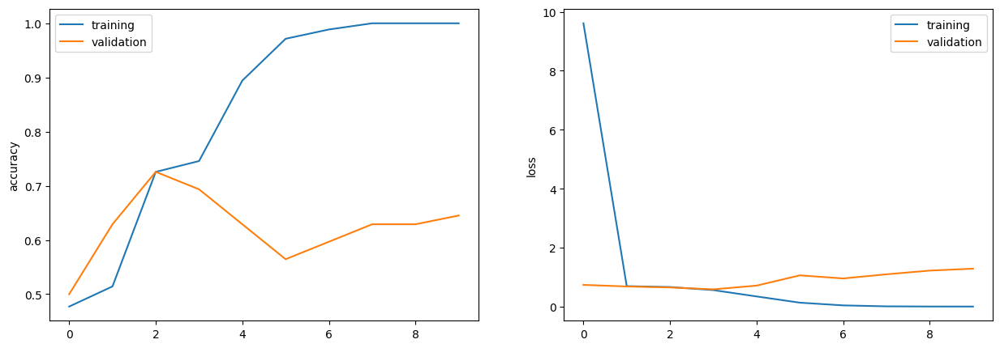

In [72]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
sns.lineplot(x=np.arange(epochs), y='accuracy', data=history.history, ax=ax[0], label='training')
sns.lineplot(x=np.arange(epochs), y='val_accuracy', data=history.history, ax=ax[0], label='validation')
sns.lineplot(x=np.arange(epochs), y='loss', data=history.history, ax=ax[1], label='training')
sns.lineplot(x=np.arange(epochs), y='val_loss', data=history.history, ax=ax[1], label='validation')
plt.show()

Predictions

Found 22 files belonging to 2 classes.
1/1 [==============================] - 1s 638ms/step


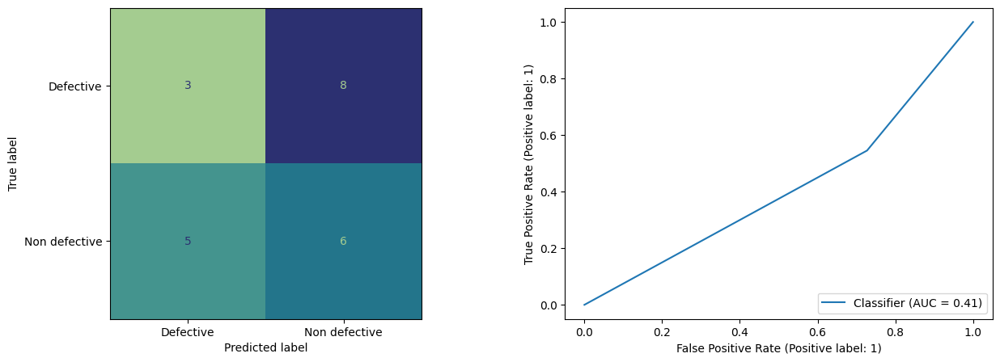

In [156]:
predictions = model.predict(data['Test'])
score = tf.nn.softmax(predictions)
y_pred = np.argmax(predictions, axis=1)
y_true = np.array(list(data['Test'].take(-1))[-1][-1])

fig, ax = plt.subplots(1, 2, figsize=(15, 5))
ConfusionMatrixDisplay.from_predictions(y_true, y_pred, display_labels=class_names, ax=ax[0], cmap='crest', colorbar=False)
RocCurveDisplay.from_predictions(y_true, y_pred, ax=ax[1])